In [1]:
!nvidia-smi
!pip -q install --upgrade pip
!pip -q install basicsr timm einops gdown imageio opencv-python albumentations matplotlib torchvision numpy==1.26.4 scipy==1.13.1

# Fresh clone
!rm -rf Restormer
!git clone https://github.com/swz30/Restormer.git
%cd Restormer

Thu Nov 27 03:07:02 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.172.08             Driver Version: 570.172.08     CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   35C    P0             29W /  250W |       0MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import numpy as np
import scipy

print("NumPy version:", np.__version__)
print("SciPy version:", scipy.__version__)

NumPy version: 1.26.4
SciPy version: 1.13.1


In [3]:
# ---- TorchVision shim for legacy imports (functional_tensor) ----
import sys, types
import torch, torchvision
print("Torch:", torch.__version__, "| TorchVision:", torchvision.__version__)

from torchvision.transforms import functional as F
ft_mod = types.ModuleType("torchvision.transforms.functional_tensor")
for k, v in F.__dict__.items():
    setattr(ft_mod, k, v)
sys.modules["torchvision.transforms.functional_tensor"] = ft_mod
print("Shim installed: torchvision.transforms.functional_tensor → .functional ✅")

Torch: 2.6.0+cu124 | TorchVision: 0.21.0+cu124
Shim installed: torchvision.transforms.functional_tensor → .functional ✅


In [4]:
# ✅ Run this as a shell cell (notice the ! at the start of each command)
CKPT_URL="https://github.com/swz30/Restormer/releases/download/v1.0/deraining.pth"

!mkdir -p ./checkpoints
!rm -f ./checkpoints/pretrained_task.pth
!curl -L "$CKPT_URL" -o ./checkpoints/pretrained_task.pth
!ls -lh ./checkpoints

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 99.8M  100 99.8M    0     0  23.1M      0  0:00:04  0:00:04 --:--:-- 24.8M
total 100M
-rw-r--r-- 1 root root 100M Nov 27 03:11 pretrained_task.pth


In [5]:
import os, torch
CKPT_PATH = "./checkpoints/pretrained_task.pth"
print("File size (MB):", os.path.getsize(CKPT_PATH)/1e6)
# Should be roughly > 50 MB
assert os.path.getsize(CKPT_PATH) > 10_000_000, "Checkpoint looks incomplete!"

# Quick load test
try:
    _ = torch.load(CKPT_PATH, map_location="cpu")
    print("✅ torch.load works fine — checkpoint OK!")
except Exception as e:
    print("❌ Problem loading checkpoint:", e)

File size (MB): 104.700429
✅ torch.load works fine — checkpoint OK!


In [6]:
# ==== RECOVERY: make sure Restormer is present and importable ====
import os, sys, subprocess, shutil, glob, importlib.util
from pathlib import Path

REPO_URL  = "https://github.com/swz30/Restormer.git"
REPO_DIR  = Path("/kaggle/working/Restormer")   # fixed absolute path

# 1) Fresh clone if missing or empty
def is_dir_empty(p: Path):
    return (not p.exists()) or (p.exists() and len(list(p.rglob("*"))) == 0)

if is_dir_empty(REPO_DIR):
    if REPO_DIR.exists():
        shutil.rmtree(REPO_DIR, ignore_errors=True)
    print("[i] Cloning Restormer repo...")
    subprocess.check_call(["git", "clone", "--depth", "1", REPO_URL, str(REPO_DIR)])
else:
    print("[i] Restormer repo already present at", REPO_DIR)

# 2) Put repo on sys.path so 'basicsr' (inside repo) is importable
if str(REPO_DIR) not in sys.path:
    sys.path.insert(0, str(REPO_DIR))
if str(REPO_DIR.parent) not in sys.path:
    sys.path.insert(0, str(REPO_DIR.parent))

# 3) Try canonical import; if it fails, import by file path
Restormer = None
try:
    from basicsr.models.archs.restormer_arch import Restormer  # type: ignore
    print("[✓] Imported Restormer from basicsr.models.archs.restormer_arch")
except Exception as e:
    print("[!] Canonical import failed:", e)
    cand = list(REPO_DIR.rglob("restormer_arch.py"))
    assert cand, "restormer_arch.py not found under repo"
    mod_path = cand[0]
    spec = importlib.util.spec_from_file_location("restormer_local", str(mod_path))
    mod = importlib.util.module_from_spec(spec)
    spec.loader.exec_module(mod)  # type: ignore
    Restormer = getattr(mod, "Restormer")
    print(f"[✓] Imported Restormer from file: {mod_path}")

[i] Restormer repo already present at /kaggle/working/Restormer
[!] Canonical import failed: No module named 'basicsr.models.archs'
[✓] Imported Restormer from file: /kaggle/working/Restormer/basicsr/models/archs/restormer_arch.py


In [7]:
# === ONE-CELL SAFE LOADER FOR RESTORMER + CHECKPOINT ===
import sys, types, importlib.util, re
from pathlib import Path
from collections import OrderedDict
import torch

# ---- Shim for legacy torchvision import used by some basicsr code ----
try:
    from torchvision.transforms import functional as F
    ft_mod = types.ModuleType("torchvision.transforms.functional_tensor")
    for k, v in F.__dict__.items():
        setattr(ft_mod, k, v)
    sys.modules["torchvision.transforms.functional_tensor"] = ft_mod
    print("Shim ok: torchvision.transforms.functional_tensor -> .functional")
except Exception as e:
    print("Shim skipped:", e)

# ---- Robust import of Restormer (canonical or file-path fallback) ----
repo_root = "/kaggle/working/Restormer"
if repo_root not in sys.path:
    sys.path.append(repo_root)

Restormer = None
try:
    from basicsr.models.archs.restormer_arch import Restormer  # type: ignore
    print("Imported Restormer from basicsr.models.archs.restormer_arch")
except Exception as e:
    print("Canonical import failed:", e)
    candidates = list(Path(repo_root).rglob("*restormer*.py"))
    assert candidates, "Restormer source not found under repo_root"
    p = str(candidates[0])
    spec = importlib.util.spec_from_file_location("restormer_local", p)
    mod = importlib.util.module_from_spec(spec)
    spec.loader.exec_module(mod)  # type: ignore
    Restormer = getattr(mod, "Restormer")
    print("Imported Restormer from file:", p)

# ---- Load checkpoint and pick the correct inner state dict ----
ckpt_path = "./checkpoints/pretrained_task.pth"
state = torch.load(ckpt_path, map_location="cpu")

if isinstance(state, dict):
    if isinstance(state.get("params_ema"), dict):
        sd = state["params_ema"]; print("Using checkpoint['params_ema']")
    elif isinstance(state.get("params"), dict):
        sd = state["params"];     print("Using checkpoint['params']")
    elif isinstance(state.get("state_dict"), dict):
        sd = state["state_dict"]; print("Using checkpoint['state_dict']")
    elif isinstance(state.get("model"), dict):
        sd = state["model"];      print("Using checkpoint['model']")
    else:
        sd = state;               print("Using checkpoint as-is (flat dict)")
else:
    sd = state;                   print("Using checkpoint as-is (non-dict)")

# strip DDP prefix if present
if any(k.startswith("module.") for k in sd.keys()):
    sd = OrderedDict((re.sub(r"^module\.", "", k), v) for k, v in sd.items())
    print("Stripped 'module.' prefixes")

def build_model(layernorm_type: str):
    return Restormer(
        inp_channels=3, out_channels=3,
        dim=48,
        num_blocks=[4,6,6,8],
        num_refinement_blocks=4,
        heads=[1,2,4,8],
        ffn_expansion_factor=2.66,
        bias=False,
        LayerNorm_type=layernorm_type,  # 'WithBias' or 'BiasFree'
        dual_pixel_task=False
    )

def try_load(layernorm_type: str):
    m = build_model(layernorm_type)
    missing, unexpected = m.load_state_dict(sd, strict=False)
    print(f"[{layernorm_type}] missing: {len(missing)} | unexpected: {len(unexpected)}")
    if missing:   print("  sample missing:", missing[:5])
    if unexpected:print("  sample unexpected:", unexpected[:5])
    return m, missing, unexpected

# Try BiasFree first, then WithBias
model, missing, unexpected = try_load("BiasFree")
if missing or unexpected:
    print("Retrying WithBias …")
    model, missing, unexpected = try_load("WithBias")

print("\nFinal -> Loaded with strict=False")
print("missing:", len(missing), "unexpected:", len(unexpected))

Shim ok: torchvision.transforms.functional_tensor -> .functional
Canonical import failed: No module named 'basicsr.models.archs'
Imported Restormer from file: /kaggle/working/Restormer/basicsr/models/archs/restormer_arch.py
Using checkpoint['params']
[BiasFree] missing: 0 | unexpected: 88
  sample unexpected: ['encoder_level1.0.norm1.body.bias', 'encoder_level1.0.norm2.body.bias', 'encoder_level1.1.norm1.body.bias', 'encoder_level1.1.norm2.body.bias', 'encoder_level1.2.norm1.body.bias']
Retrying WithBias …
[WithBias] missing: 0 | unexpected: 0

Final -> Loaded with strict=False
missing: 0 unexpected: 0


In [8]:
# freeze everything
for p in model.parameters(): p.requires_grad = False

# unfreeze late/refinement + output head (adjust names if needed)
to_unfreeze = []
for n, p in model.named_parameters():
    if any(k in n.lower() for k in ["refinement", "reconstruct", "reconstruction", "conv_out", "tail"]):
        p.requires_grad = True
        to_unfreeze.append(n)

# fallback: if nothing matched, unfreeze last ~10 params
if not to_unfreeze:
    for n,p in list(model.named_parameters())[-10:]:
        p.requires_grad = True
        to_unfreeze.append(n)

print("Unfreezing:", *to_unfreeze[:8], "...", sep="\n")

import torch
trainable = [p for p in model.parameters() if p.requires_grad]
opt_G = torch.optim.Adam(trainable, lr=1e-5, betas=(0.9,0.999))

Unfreezing:
refinement.0.norm1.body.weight
refinement.0.norm1.body.bias
refinement.0.attn.temperature
refinement.0.attn.qkv.weight
refinement.0.attn.qkv_dwconv.weight
refinement.0.attn.project_out.weight
refinement.0.norm2.body.weight
refinement.0.norm2.body.bias
...


In [9]:
import torch.nn as nn, torchvision

device = "cuda" if torch.cuda.is_available() else "cpu"
model = model.to(device).train()

# perceptual VGG features
vgg = torchvision.models.vgg19(weights=torchvision.models.VGG19_Weights.IMAGENET1K_V1).features[:16].eval().to(device)
for p in vgg.parameters(): p.requires_grad = False
l1, mse = nn.L1Loss(), nn.MSELoss()

# tiny PatchGAN
class PatchD(nn.Module):
    def __init__(self, in_ch=3, base=64):
        super().__init__()
        def blk(ic, oc, norm=True):
            m=[nn.Conv2d(ic, oc, 4, 2, 1)]
            if norm: m+=[nn.InstanceNorm2d(oc, affine=True)]
            m+=[nn.LeakyReLU(0.2, inplace=True)]
            return nn.Sequential(*m)
        self.net = nn.Sequential(
            blk(in_ch, base, norm=False),
            blk(base, base*2),
            blk(base*2, base*4),
            nn.Conv2d(base*4, 1, 3, 1, 1)
        )
    def forward(self, x): return self.net(x)

disc = PatchD().to(device).train()
opt_D = torch.optim.Adam(disc.parameters(), lr=2e-4, betas=(0.5,0.999))

def adv_loss(pred, is_real): 
    tgt = torch.ones_like(pred) if is_real else torch.zeros_like(pred)
    return mse(pred, tgt)

L_ADV, L_PERC, L_ID = 1.0, 0.1, 0.1

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:02<00:00, 239MB/s]


In [10]:
# ==== CELL 10 (MODIFIED): Single-Domain Data Loaders ====
import os, glob, random, cv2, torch
import numpy as np
from torch.utils.data import Dataset, DataLoader
import albumentations as A

BASE_DIR = "/kaggle/input/claude-synthesis-new"

DATA_ROOTS = {
    "clean":     os.path.join(BASE_DIR, "clean"),
    "fog":       os.path.join(BASE_DIR, "fog"),
    "rain":      os.path.join(BASE_DIR, "rain"),
    "lowlight":  os.path.join(BASE_DIR, "lowlight"),
}

DEG_DOMAINS = [d for d in DATA_ROOTS.keys() if d != "clean"]
CLEAN_DIR   = DATA_ROOTS["clean"]

def list_images(path):
    exts = ("*.jpg","*.jpeg","*.png","*.bmp")
    files = []
    for e in exts:
        files += glob.glob(os.path.join(path, e))
        files += glob.glob(os.path.join(path, "**", e), recursive=True)
    if not files:
        raise FileNotFoundError(f"No images found in {path}")
    return sorted(files)

# MODIFIED: Simpler augmentations for EDAR training
train_tf = A.Compose([
    A.LongestMaxSize(max_size=384),
    A.PadIfNeeded(min_height=384, min_width=384, border_mode=cv2.BORDER_REFLECT_101),
    A.RandomCrop(256, 256),
    A.HorizontalFlip(p=0.5),
    # REMOVED: RandomBrightnessContrast (let EDAR learn from clean data)
])

val_tf = A.Compose([
    A.LongestMaxSize(max_size=512),
    A.PadIfNeeded(min_height=512, min_width=512, border_mode=cv2.BORDER_REFLECT_101),
])

def to_tensor(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = np.ascontiguousarray(img).astype(np.float32)/255.0
    return torch.from_numpy(np.transpose(img,(2,0,1)))

# MODIFIED: Paired dataset (degraded -> clean pairs, not random)
class PairedDataset(Dataset):
    """Returns paired (degraded, clean) samples"""
    def __init__(self, deg_files, cln_files, transform=None, paired=True):
        self.deg_files = deg_files
        self.cln_files = cln_files
        self.tf = transform
        self.paired = paired
        
        # For paired training, ensure same count
        if paired:
            min_len = min(len(deg_files), len(cln_files))
            self.deg_files = deg_files[:min_len]
            self.cln_files = cln_files[:min_len]
    
    def __len__(self): 
        return len(self.deg_files)
    
    def __getitem__(self, idx):
        dimg = cv2.imread(self.deg_files[idx])
        
        if self.paired:
            cimg = cv2.imread(self.cln_files[idx])  # Same index for paired
        else:
            cimg = cv2.imread(random.choice(self.cln_files))  # Random for unpaired
        
        if self.tf:
            # Apply same augmentation to both (paired consistency)
            seed = np.random.randint(0, 999999)
            random.seed(seed); np.random.seed(seed)
            dimg = self.tf(image=dimg)['image']
            random.seed(seed); np.random.seed(seed)
            cimg = self.tf(image=cimg)['image']
        
        return to_tensor(dimg), to_tensor(cimg), os.path.basename(self.deg_files[idx])

def build_loader_for(domain, batch_size=2, train=True, paired=False):
    """
    Build dataloader for single domain
    
    Args:
        domain: 'fog', 'rain', or 'lowlight'
        batch_size: batch size
        train: training or validation mode
        paired: if True, use paired data (same index); if False, random clean images
    """
    deg_dir = DATA_ROOTS[domain]
    deg_files = list_images(deg_dir)
    cln_files = list_images(CLEAN_DIR)
    
    tf = train_tf if train else val_tf
    ds = PairedDataset(deg_files, cln_files, transform=tf, paired=paired)
    
    return DataLoader(
        ds, 
        batch_size=batch_size, 
        shuffle=train, 
        num_workers=2, 
        pin_memory=True, 
        drop_last=train
    ), len(deg_files)

# Build loaders for all domains
train_loaders = {}
val_loaders   = {}
counts = {}

for d in DEG_DOMAINS:
    # TRAIN: Unpaired (random clean images) - better for unlabeled scenario
    tl, n = build_loader_for(d, batch_size=4, train=True, paired=False)
    
    # VAL: Use all samples, no pairing needed
    vl, _ = build_loader_for(d, batch_size=1, train=False, paired=False)
    
    train_loaders[d] = tl
    val_loaders[d]   = vl
    counts[d] = n

print("✅ Data loaders created (EDAR optimized)")
print("\nDomain image counts:")
for d, n in counts.items():
    print(f"  {d:12s}: {n}")

print("\nTrain loader batches per domain:")
for d, dl in train_loaders.items():
    print(f"  {d:12s}: {len(dl)} batches")

print("\nVal samples per domain:")
for d, dl in val_loaders.items():
    print(f"  {d:12s}: {len(dl.dataset)} samples")

✅ Data loaders created (EDAR optimized)

Domain image counts:
  fog         : 1000
  rain        : 1000
  lowlight    : 1000

Train loader batches per domain:
  fog         : 250 batches
  rain        : 250 batches
  lowlight    : 250 batches

Val samples per domain:
  fog         : 1000 samples
  rain        : 1000 samples
  lowlight    : 1000 samples


In [11]:
# ============================================================
# CELL 13: EDAR MODULES (Edge-Aware Domain-Adaptive Restormer)
# ============================================================

import torch
import torch.nn as nn
import torch.nn.functional as F

# -------- 1. EDGE EXTRACTOR --------
class FastEdgeExtractor(nn.Module):
    """Sobel edge detection - fast and differentiable"""
    def __init__(self):
        super().__init__()
        sobel_x = torch.tensor([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=torch.float32)
        sobel_y = torch.tensor([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=torch.float32)
        self.register_buffer('sobel_x', sobel_x.view(1, 1, 3, 3))
        self.register_buffer('sobel_y', sobel_y.view(1, 1, 3, 3))
        
    def forward(self, x):
        """x: [B, 3, H, W] -> edges: [B, 1, H, W]"""
        gray = 0.299*x[:,0:1] + 0.587*x[:,1:2] + 0.114*x[:,2:3]
        grad_x = F.conv2d(gray, self.sobel_x, padding=1)
        grad_y = F.conv2d(gray, self.sobel_y, padding=1)
        edges = torch.sqrt(grad_x**2 + grad_y**2 + 1e-6)
        return edges


# -------- 2. DOMAIN ENCODER --------
class SimpleDomainEncoder(nn.Module):
    """Maps domain name to learnable embedding"""
    def __init__(self, n_domains=3, embed_dim=64):
        super().__init__()
        self.embedding = nn.Embedding(n_domains, embed_dim)
        self.domain_map = {'fog': 0, 'rain': 1, 'lowlight': 2}
        
    def forward(self, domain_name):
        """domain_name: str -> [1, embed_dim, 1, 1]"""
        idx = torch.tensor([self.domain_map[domain_name]], device=self.embedding.weight.device)
        emb = self.embedding(idx)
        return emb[:, :, None, None]


# -------- 3. EDGE-GUIDED REFINEMENT --------
class LightweightEdgeRefinement(nn.Module):
    """Injects edge info into features"""
    def __init__(self, in_channels=96):
        super().__init__()
        self.edge_process = nn.Sequential(
            nn.Conv2d(1, 16, 3, 1, 1, bias=False),
            nn.ReLU(inplace=True),
            nn.Conv2d(16, 32, 3, 1, 1, bias=False),
            nn.ReLU(inplace=True)
        )
        self.gate = nn.Sequential(
            nn.Conv2d(in_channels + 32, 32, 1, bias=False),
            nn.Sigmoid()
        )
        self.fuse = nn.Conv2d(in_channels + 32, in_channels, 1, bias=False)
        
    def forward(self, feat, edge_map):
        """feat: [B, C, H, W], edge_map: [B, 1, H, W]"""
        if edge_map.shape[2:] != feat.shape[2:]:
            edge_map = F.interpolate(edge_map, size=feat.shape[2:], mode='bilinear', align_corners=False)
        
        edge_feat = self.edge_process(edge_map)
        combined = torch.cat([feat, edge_feat], dim=1)
        attn = self.gate(combined)
        edge_weighted = edge_feat * attn
        fused = self.fuse(torch.cat([feat, edge_weighted], dim=1))
        return feat + fused


# -------- 4. DOMAIN-ADAPTIVE MODULATION --------
class DomainModulation(nn.Module):
    """FiLM-style domain conditioning"""
    def __init__(self, feat_channels=96, domain_dim=64):
        super().__init__()
        self.scale = nn.Linear(domain_dim, feat_channels)
        self.shift = nn.Linear(domain_dim, feat_channels)
        
    def forward(self, feat, domain_emb):
        """feat: [B, C, H, W], domain_emb: [B, D, 1, 1]"""
        domain_vec = domain_emb.squeeze(-1).squeeze(-1)
        gamma = self.scale(domain_vec)[:, :, None, None]
        beta = self.shift(domain_vec)[:, :, None, None]
        return feat * (1 + gamma) + beta


# -------- 5. EDAR WRAPPER --------
class EDARWrapper(nn.Module):
    """Wraps Restormer with EDAR components"""
    def __init__(self, base_restormer, n_domains=3):
        super().__init__()
        self.restormer = base_restormer
        
        # EDAR modules
        self.edge_extractor = FastEdgeExtractor()
        self.domain_encoder = SimpleDomainEncoder(n_domains, embed_dim=64)
        self.edge_refine = LightweightEdgeRefinement(in_channels=96)
        self.domain_mod = DomainModulation(feat_channels=96, domain_dim=64)
        
        self.use_edar = True
        
    def forward(self, x, domain=None):
        """
        x: [B, 3, H, W], domain: str or None
        Returns: (output, edges)
        """
        edges = self.edge_extractor(x)
        
        domain_emb = None
        if domain is not None and self.use_edar:
            domain_emb = self.domain_encoder(domain)
        
        # Restormer encoder
        inp_enc = self.restormer.patch_embed(x)
        enc1 = self.restormer.encoder_level1(inp_enc)
        enc2 = self.restormer.encoder_level2(self.restormer.down1_2(enc1))
        enc3 = self.restormer.encoder_level3(self.restormer.down2_3(enc2))
        
        # Bottleneck
        latent = self.restormer.latent(self.restormer.down3_4(enc3))
        
        # Decoder
        dec3 = self.restormer.decoder_level3(
            self.restormer.reduce_chan_level3(
                torch.cat([self.restormer.up4_3(latent), enc3], 1)
            )
        )
        dec2 = self.restormer.decoder_level2(
            self.restormer.reduce_chan_level2(
                torch.cat([self.restormer.up3_2(dec3), enc2], 1)
            )
        )
        dec1 = self.restormer.decoder_level1(
            torch.cat([self.restormer.up2_1(dec2), enc1], 1)
        )
        
        # EDAR injection
        if domain_emb is not None:
            dec1 = self.domain_mod(dec1, domain_emb)
        
        refined = self.restormer.refinement(dec1)
        if self.use_edar:
            refined = self.edge_refine(refined, edges)
        
        output = self.restormer.output(refined)
        return output, edges
    
    def baseline_mode(self):
        self.use_edar = False
        
    def edar_mode(self):
        self.use_edar = True

print("✅ EDAR modules loaded successfully!")

✅ EDAR modules loaded successfully!


In [12]:
# ============================================================
# CELL 14: TEST EDAR WRAPPER
# ============================================================

device = "cuda" if torch.cuda.is_available() else "cpu"

# Wrap your existing model
edar_model = EDARWrapper(model, n_domains=3).to(device)
print(f"✅ EDAR model created on {device}")

# Test forward pass
test_input = torch.randn(1, 3, 256, 256).to(device)
with torch.no_grad():
    test_out, test_edges = edar_model(test_input, domain='fog')
    
print(f"✅ Forward pass successful!")
print(f"   Input shape:  {tuple(test_input.shape)}")
print(f"   Output shape: {tuple(test_out.shape)}")
print(f"   Edges shape:  {tuple(test_edges.shape)}")

# Count trainable parameters
edar_params = sum(p.numel() for p in edar_model.parameters() if p.requires_grad)
print(f"✅ Trainable parameters: {edar_params:,}")

✅ EDAR model created on cuda
✅ Forward pass successful!
   Input shape:  (1, 3, 256, 256)
   Output shape: (1, 3, 256, 256)
   Edges shape:  (1, 1, 256, 256)
✅ Trainable parameters: 505,292


In [13]:
# ============================================================
# CELL 15: MULTI-DOMAIN EDAR TRAINING WITH INLINE VISUALIZATION
# ============================================================

from tqdm import tqdm
import os
import torch.nn as nn
import torchvision
from itertools import cycle
import matplotlib.pyplot as plt
from IPython.display import display, clear_output
import numpy as np

def train_edar_multidomain_with_gan(
    edar_model,
    discriminator,
    vgg_model,
    train_loaders,
    val_loaders,
    epochs=8,
    device='cuda',
    save_dir='./edar_multidomain_checkpoints'
):
    """
    Train EDAR on all 3 domains with inline preview visualization
    """
    
    os.makedirs(save_dir, exist_ok=True)
    os.makedirs('./edar_multidomain_samples', exist_ok=True)
    for domain in ['fog', 'rain', 'lowlight']:
        os.makedirs(f'./edar_multidomain_samples/{domain}', exist_ok=True)
    
    # Setup
    for param in edar_model.restormer.parameters():
        param.requires_grad = False
    for param in edar_model.restormer.refinement.parameters():
        param.requires_grad = True
    for param in edar_model.restormer.output.parameters():
        param.requires_grad = True
    
    gen_params = (
        list(edar_model.edge_extractor.parameters()) +
        list(edar_model.domain_encoder.parameters()) +
        list(edar_model.edge_refine.parameters()) +
        list(edar_model.domain_mod.parameters()) +
        list(edar_model.restormer.refinement.parameters()) +
        list(edar_model.restormer.output.parameters())
    )
    
    opt_G = torch.optim.Adam(gen_params, lr=1e-5, betas=(0.9, 0.999))
    opt_D = torch.optim.Adam(discriminator.parameters(), lr=2e-4, betas=(0.5, 0.999))
    
    l1_loss = nn.L1Loss()
    mse_loss = nn.MSELoss()
    
    def adv_loss(pred, is_real):
        target = torch.ones_like(pred) if is_real else torch.zeros_like(pred)
        return mse_loss(pred, target)
    
    L_ADV, L_PERC, L_ID, L_EDGE = 1.0, 0.1, 0.1, 0.2
    
    scaler_G = torch.cuda.amp.GradScaler(enabled=(device=="cuda"))
    scaler_D = torch.cuda.amp.GradScaler(enabled=(device=="cuda"))
    
    # Round-robin iterator
    def round_robin_batches(loaders_dict):
        iters = {k: cycle(v) for k, v in loaders_dict.items()}
        domains = list(loaders_dict.keys())
        while True:
            for domain in domains:
                yield domain, next(iters[domain])
    
    steps_per_epoch = min(len(dl) for dl in train_loaders.values()) * len(train_loaders)
    rr_iter = round_robin_batches(train_loaders)
    
    print(f"Steps per epoch: {steps_per_epoch} (balanced across domains)")
    
    # Training loop
    best_loss = float('inf')
    
    for epoch in range(1, epochs+1):
        edar_model.train()
        discriminator.train()
        
        epoch_losses = {
            'G_total': [], 'G_adv': [], 'G_perc': [], 
            'G_id': [], 'G_edge': [], 'D': [],
            'fog': [], 'rain': [], 'lowlight': []
        }
        
        pbar = tqdm(range(steps_per_epoch), desc=f'Epoch {epoch}/{epochs}')
        
        for step in pbar:
            domain, (degraded, clean, _) = next(rr_iter)
            degraded, clean = degraded.to(device), clean.to(device)
            
            # ========== GENERATOR STEP ==========
            opt_G.zero_grad(set_to_none=True)
            
            with torch.cuda.amp.autocast(enabled=(device=="cuda")):
                fake, edges_pred = edar_model(degraded, domain=domain)
                edges_target = edar_model.edge_extractor(clean)
                
                loss_g_adv = adv_loss(discriminator(fake), True) * L_ADV
                loss_g_perc = l1_loss(vgg_model(fake), vgg_model(clean)) * L_PERC
                
                identity, _ = edar_model(clean, domain=domain)
                loss_g_id = l1_loss(identity, clean) * L_ID
                
                loss_g_edge = l1_loss(edges_pred, edges_target) * L_EDGE
                
                loss_G = loss_g_adv + loss_g_perc + loss_g_id + loss_g_edge
            
            scaler_G.scale(loss_G).backward()
            scaler_G.step(opt_G)
            scaler_G.update()
            
            # ========== DISCRIMINATOR STEP ==========
            opt_D.zero_grad(set_to_none=True)
            
            with torch.cuda.amp.autocast(enabled=(device=="cuda")):
                pred_real = discriminator(clean)
                pred_fake = discriminator(fake.detach())
                loss_D = 0.5 * (adv_loss(pred_real, True) + adv_loss(pred_fake, False))
            
            scaler_D.scale(loss_D).backward()
            scaler_D.step(opt_D)
            scaler_D.update()
            
            # Track losses
            epoch_losses['G_total'].append(loss_G.item())
            epoch_losses['G_adv'].append(loss_g_adv.item())
            epoch_losses['G_perc'].append(loss_g_perc.item())
            epoch_losses['G_id'].append(loss_g_id.item())
            epoch_losses['G_edge'].append(loss_g_edge.item())
            epoch_losses['D'].append(loss_D.item())
            epoch_losses[domain].append(loss_G.item())
            
            pbar.set_postfix({
                'G': f'{loss_G.item():.3f}',
                'D': f'{loss_D.item():.3f}',
                'Edge': f'{loss_g_edge.item():.3f}',
                'dom': domain
            })
        
        # ========== EPOCH SUMMARY ==========
        print(f"\n{'='*60}")
        print(f"Epoch {epoch}/{epochs} Summary:")
        print(f"  Overall Generator Loss: {np.mean(epoch_losses['G_total']):.4f}")
        print(f"    ├─ Adversarial: {np.mean(epoch_losses['G_adv']):.4f}")
        print(f"    ├─ Perceptual:  {np.mean(epoch_losses['G_perc']):.4f}")
        print(f"    ├─ Identity:    {np.mean(epoch_losses['G_id']):.4f}")
        print(f"    └─ Edge (NEW):  {np.mean(epoch_losses['G_edge']):.4f}")
        print(f"  Discriminator Loss:     {np.mean(epoch_losses['D']):.4f}")
        print(f"\n  Per-Domain Generator Losses:")
        print(f"    🌫️  Fog:      {np.mean(epoch_losses['fog']):.4f}")
        print(f"    🌧️  Rain:     {np.mean(epoch_losses['rain']):.4f}")
        print(f"    🌙 Lowlight: {np.mean(epoch_losses['lowlight']):.4f}")
        print(f"{'='*60}\n")
        
        # ========== SAVE & DISPLAY SAMPLES ==========
        print("Generating preview samples...")
        sample_images = save_and_collect_samples(
            edar_model, val_loaders, epoch, device
        )
        
        # Display inline
        display_samples_inline(sample_images, epoch)
        
        # ========== CHECKPOINTING ==========
        avg_G = np.mean(epoch_losses['G_total'])
        ckpt_path = f'{save_dir}/edar_multidomain_ep{epoch:02d}.pth'
        torch.save({
            'epoch': epoch,
            'edar_model': edar_model.state_dict(),
            'discriminator': discriminator.state_dict(),
            'opt_G': opt_G.state_dict(),
            'opt_D': opt_D.state_dict(),
        }, ckpt_path)
        
        if avg_G < best_loss:
            best_loss = avg_G
            best_path = f'{save_dir}/edar_multidomain_best.pth'
            torch.save(edar_model.state_dict(), best_path)
            print(f"✅ Best model saved: {best_path}\n")
    
    print(f"\n{'='*60}")
    print("✅ MULTI-DOMAIN TRAINING COMPLETE!")
    print(f"{'='*60}")
    return edar_model


def save_and_collect_samples(model, val_loaders, epoch, device):
    """
    Save samples for all domains and return them for display
    Returns dict: {domain: [sample_arrays]}
    """
    import torchvision.utils as vutils
    
    model.eval()
    sample_images = {}
    
    with torch.no_grad():
        for domain in ['fog', 'rain', 'lowlight']:
            domain_samples = []
            
            for idx, (degraded, clean, name) in enumerate(val_loaders[domain]):
                if idx >= 2:  # Save 2 samples per domain
                    break
                
                degraded = degraded.to(device)
                clean = clean.to(device)
                
                restored, edges = model(degraded, domain=domain)
                restored = torch.clamp(restored, 0, 1)
                
                # Create 4-panel grid: [degraded | restored | clean | edges]
                grid = torch.cat([
                    degraded[0:1],
                    restored[0:1],
                    clean[0:1],
                    edges[0:1].repeat(1, 3, 1, 1)
                ], dim=3)
                
                # Save to disk
                save_path = f'./edar_multidomain_samples/{domain}/ep{epoch:02d}_sample{idx}.png'
                vutils.save_image(grid, save_path, normalize=False)
                
                # Convert to numpy for display
                grid_np = grid[0].permute(1, 2, 0).cpu().numpy()
                domain_samples.append(grid_np)
            
            sample_images[domain] = domain_samples
    
    model.train()
    return sample_images


def display_samples_inline(sample_images, epoch):
    """
    Display samples inline in notebook output
    Layout: 3 rows (fog/rain/lowlight), 2 columns (samples)
    """
    fig, axes = plt.subplots(3, 2, figsize=(20, 15))
    
    domains = ['fog', 'rain', 'lowlight']
    domain_icons = {'fog': '🌫️', 'rain': '🌧️', 'lowlight': '🌙'}
    
    for row_idx, domain in enumerate(domains):
        samples = sample_images[domain]
        
        for col_idx, sample in enumerate(samples):
            ax = axes[row_idx, col_idx]
            ax.imshow(sample)
            ax.axis('off')
            
            if col_idx == 0:
                ax.set_title(
                    f"{domain_icons[domain]} {domain.upper()} - Sample {col_idx+1}\n"
                    f"[Degraded | Restored | Clean | Edges]",
                    fontsize=12, fontweight='bold', pad=10
                )
            else:
                ax.set_title(
                    f"Sample {col_idx+1}\n[Degraded | Restored | Clean | Edges]",
                    fontsize=12, fontweight='bold', pad=10
                )
    
    plt.suptitle(
        f'EPOCH {epoch} - EDAR Multi-Domain Results',
        fontsize=16, fontweight='bold', y=0.995
    )
    plt.tight_layout()
    plt.show()
    
    print(f"✅ Samples saved to: ./edar_multidomain_samples/[domain]/ep{epoch:02d}_sampleX.png\n")


print("✅ Multi-domain training function with inline visualization ready!")

✅ Multi-domain training function with inline visualization ready!


In [14]:
# ============================================================
# CELL 16: SETUP DISCRIMINATOR + VGG (Your Working Setup)
# ============================================================

import torch.nn as nn
import torchvision

# ===== DISCRIMINATOR (Your PatchGAN) =====
class PatchD(nn.Module):
    def __init__(self, in_ch=3, base=64):
        super().__init__()
        def blk(ic, oc, norm=True):
            m=[nn.Conv2d(ic, oc, 4, 2, 1)]
            if norm: m+=[nn.InstanceNorm2d(oc, affine=True)]
            m+=[nn.LeakyReLU(0.2, inplace=True)]
            return nn.Sequential(*m)
        self.net = nn.Sequential(
            blk(in_ch, base, norm=False),
            blk(base, base*2),
            blk(base*2, base*4),
            nn.Conv2d(base*4, 1, 3, 1, 1)
        )
    def forward(self, x): return self.net(x)

disc = PatchD().to(device).train()
print("✅ Discriminator loaded")

# ===== VGG FOR PERCEPTUAL LOSS =====
vgg = torchvision.models.vgg19(
    weights=torchvision.models.VGG19_Weights.IMAGENET1K_V1
).features[:16].eval().to(device)

for p in vgg.parameters(): 
    p.requires_grad = False

print("✅ VGG-19 loaded for perceptual loss")

✅ Discriminator loaded
✅ VGG-19 loaded for perceptual loss


/tmp/ipykernel_20/4280272256.py:62: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler_G = torch.cuda.amp.GradScaler(enabled=(device=="cuda"))
/tmp/ipykernel_20/4280272256.py:63: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler_D = torch.cuda.amp.GradScaler(enabled=(device=="cuda"))


🌐 TRAINING EDAR ACROSS ALL DOMAINS (FOG + RAIN + LOWLIGHT)
Steps per epoch: 750 (balanced across domains)


Epoch 1/8:   0%|          | 0/750 [00:00<?, ?it/s]/tmp/ipykernel_20/4280272256.py:100: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device=="cuda")):
/tmp/ipykernel_20/4280272256.py:121: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device=="cuda")):
Epoch 1/8: 100%|██████████| 750/750 [38:30<00:00,  3.08s/it, G=0.467, D=0.152, Edge=0.048, dom=lowlight]


Epoch 1/8 Summary:
  Overall Generator Loss: 0.8322
    ├─ Adversarial: 0.6626
    ├─ Perceptual:  0.0952
    ├─ Identity:    0.0240
    └─ Edge (NEW):  0.0503
  Discriminator Loss:     0.1202

  Per-Domain Generator Losses:
    🌫️  Fog:      0.9115
    🌧️  Rain:     0.9771
    🌙 Lowlight: 0.6079

Generating preview samples...



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/tmp/ipykernel_20/4280272256.py:273: UserWarning: Glyph 127787 (\N{FOG}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_20/4280272256.py:273: UserWarning: Glyph 127783 (\N{CLOUD WITH RAIN}) missing from current font.
  plt.tight_layout()
/tmp/ipykernel_20/4280272256.py:273: UserWarning: Glyph 127769 (\N{CRESCENT MOON}) mi

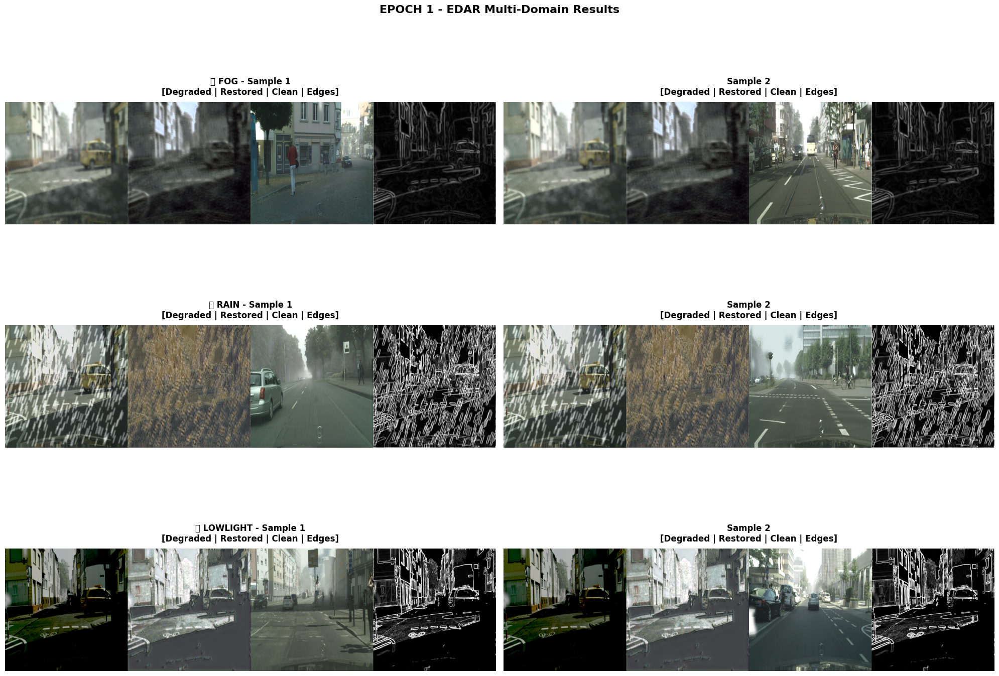

✅ Samples saved to: ./edar_multidomain_samples/[domain]/ep01_sampleX.png

✅ Best model saved: ./edar_multidomain_checkpoints/edar_multidomain_best.pth



Epoch 2/8: 100%|██████████| 750/750 [38:29<00:00,  3.08s/it, G=0.846, D=0.062, Edge=0.048, dom=lowlight]


Epoch 2/8 Summary:
  Overall Generator Loss: 0.8614
    ├─ Adversarial: 0.7013
    ├─ Perceptual:  0.0972
    ├─ Identity:    0.0127
    └─ Edge (NEW):  0.0503
  Discriminator Loss:     0.0977

  Per-Domain Generator Losses:
    🌫️  Fog:      0.8798
    🌧️  Rain:     1.1085
    🌙 Lowlight: 0.5959

Generating preview samples...



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


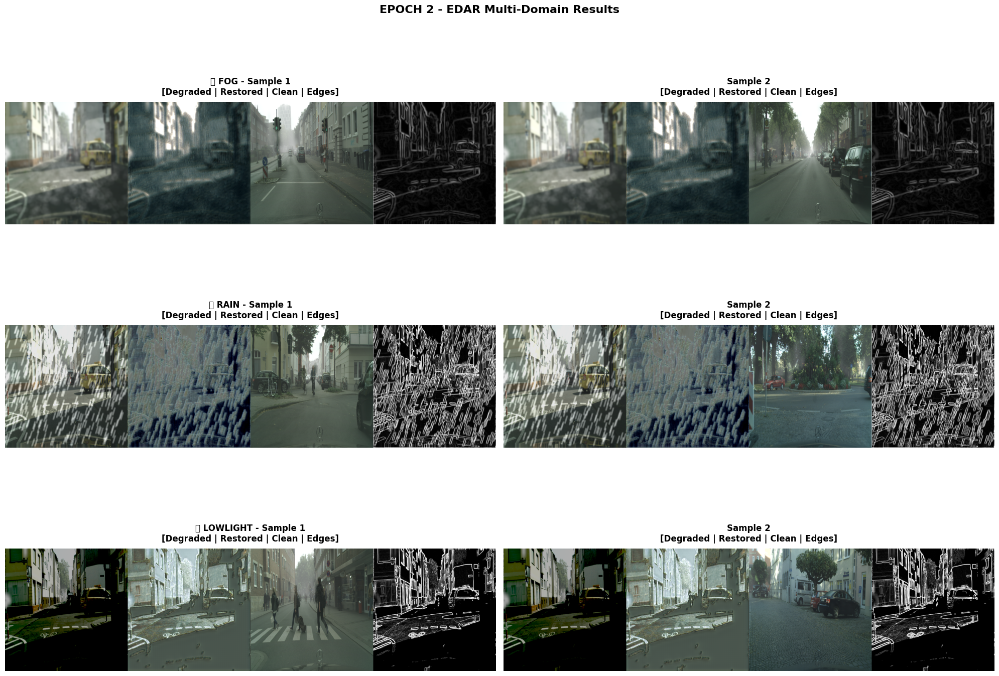

✅ Samples saved to: ./edar_multidomain_samples/[domain]/ep02_sampleX.png



Epoch 3/8: 100%|██████████| 750/750 [38:29<00:00,  3.08s/it, G=0.885, D=0.091, Edge=0.048, dom=lowlight]


Epoch 3/8 Summary:
  Overall Generator Loss: 0.8743
    ├─ Adversarial: 0.7168
    ├─ Perceptual:  0.0974
    ├─ Identity:    0.0098
    └─ Edge (NEW):  0.0503
  Discriminator Loss:     0.0931

  Per-Domain Generator Losses:
    🌫️  Fog:      0.9152
    🌧️  Rain:     1.0370
    🌙 Lowlight: 0.6707

Generating preview samples...



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


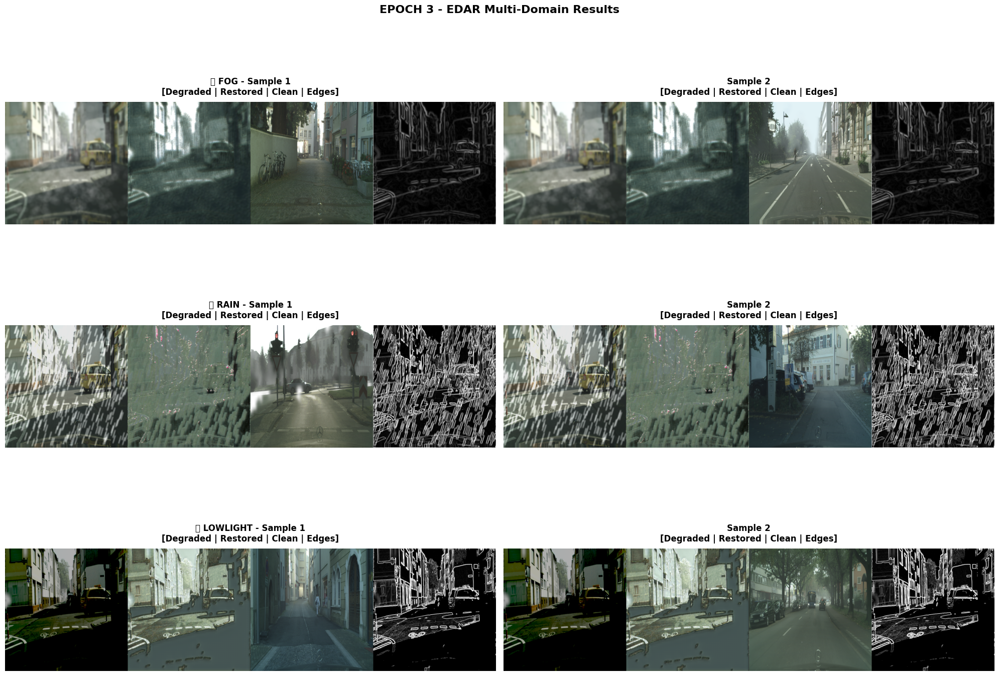

✅ Samples saved to: ./edar_multidomain_samples/[domain]/ep03_sampleX.png



Epoch 4/8: 100%|██████████| 750/750 [38:29<00:00,  3.08s/it, G=0.995, D=0.114, Edge=0.048, dom=lowlight]


Epoch 4/8 Summary:
  Overall Generator Loss: 0.8677
    ├─ Adversarial: 0.7129
    ├─ Perceptual:  0.0949
    ├─ Identity:    0.0097
    └─ Edge (NEW):  0.0503
  Discriminator Loss:     0.0944

  Per-Domain Generator Losses:
    🌫️  Fog:      0.8463
    🌧️  Rain:     1.0478
    🌙 Lowlight: 0.7090

Generating preview samples...



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


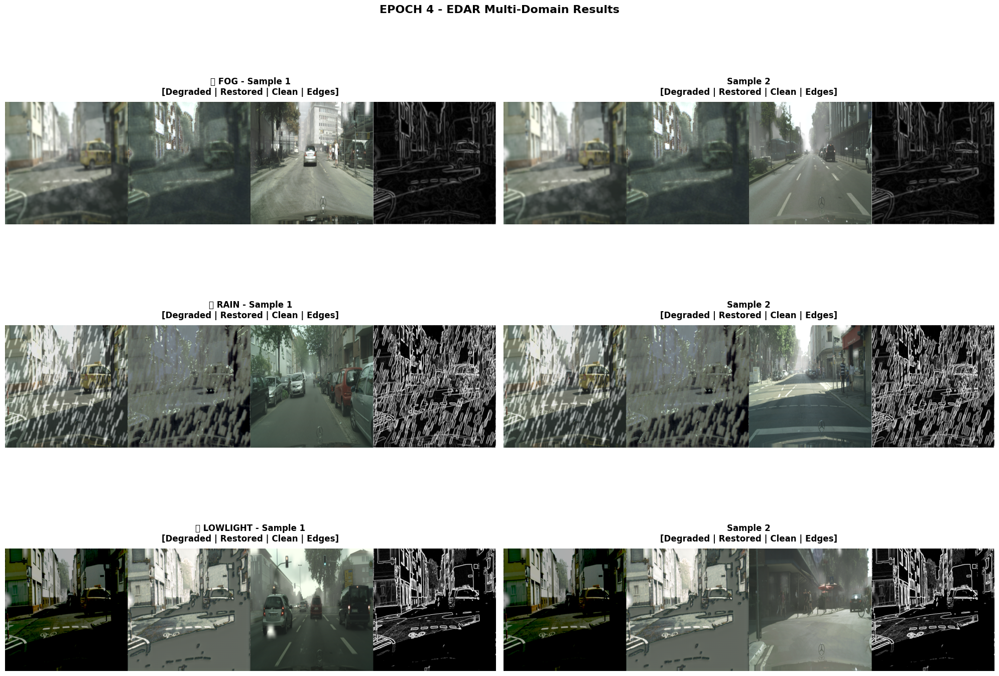

✅ Samples saved to: ./edar_multidomain_samples/[domain]/ep04_sampleX.png



Epoch 5/8: 100%|██████████| 750/750 [38:29<00:00,  3.08s/it, G=0.842, D=0.149, Edge=0.048, dom=lowlight]


Epoch 5/8 Summary:
  Overall Generator Loss: 0.8950
    ├─ Adversarial: 0.7396
    ├─ Perceptual:  0.0955
    ├─ Identity:    0.0096
    └─ Edge (NEW):  0.0503
  Discriminator Loss:     0.0868

  Per-Domain Generator Losses:
    🌫️  Fog:      0.8340
    🌧️  Rain:     1.1000
    🌙 Lowlight: 0.7510

Generating preview samples...



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


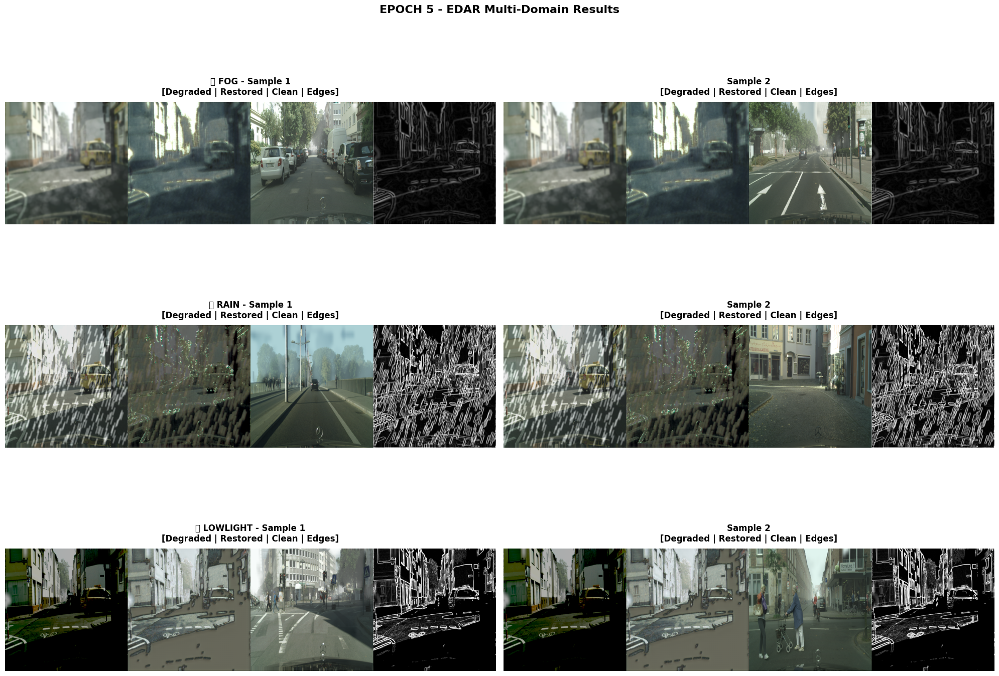

✅ Samples saved to: ./edar_multidomain_samples/[domain]/ep05_sampleX.png



Epoch 6/8: 100%|██████████| 750/750 [38:29<00:00,  3.08s/it, G=0.882, D=0.111, Edge=0.048, dom=lowlight]


Epoch 6/8 Summary:
  Overall Generator Loss: 0.9038
    ├─ Adversarial: 0.7473
    ├─ Perceptual:  0.0969
    ├─ Identity:    0.0094
    └─ Edge (NEW):  0.0503
  Discriminator Loss:     0.0833

  Per-Domain Generator Losses:
    🌫️  Fog:      0.8403
    🌧️  Rain:     1.0919
    🌙 Lowlight: 0.7792

Generating preview samples...



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


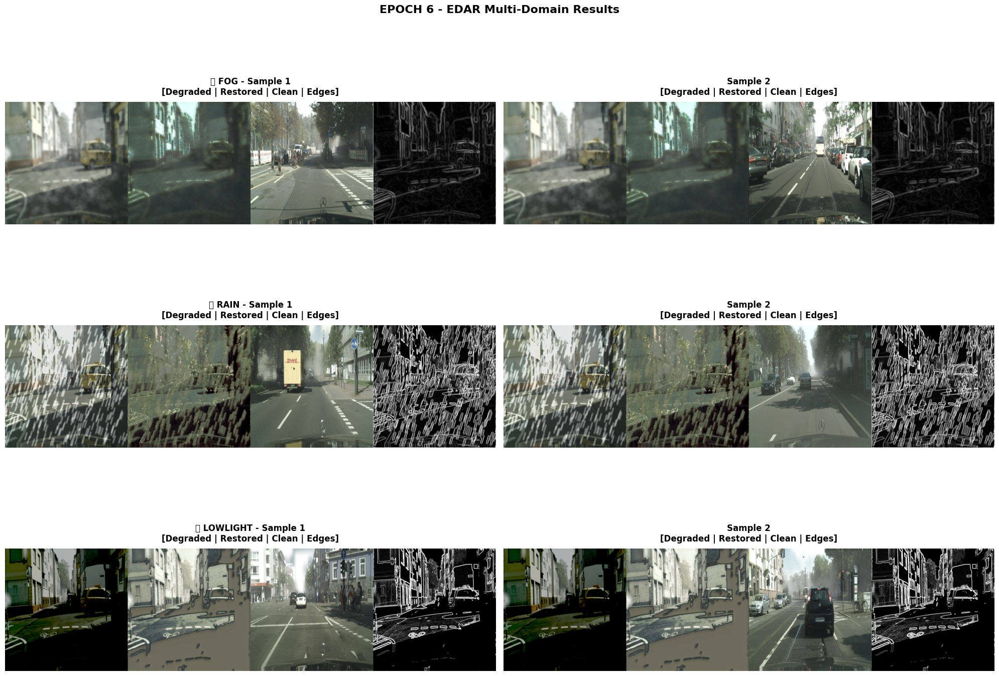

✅ Samples saved to: ./edar_multidomain_samples/[domain]/ep06_sampleX.png



Epoch 7/8: 100%|██████████| 750/750 [38:29<00:00,  3.08s/it, G=0.668, D=0.123, Edge=0.048, dom=lowlight]


Epoch 7/8 Summary:
  Overall Generator Loss: 0.9078
    ├─ Adversarial: 0.7513
    ├─ Perceptual:  0.0973
    ├─ Identity:    0.0089
    └─ Edge (NEW):  0.0503
  Discriminator Loss:     0.0819

  Per-Domain Generator Losses:
    🌫️  Fog:      0.8377
    🌧️  Rain:     1.0749
    🌙 Lowlight: 0.8108

Generating preview samples...



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


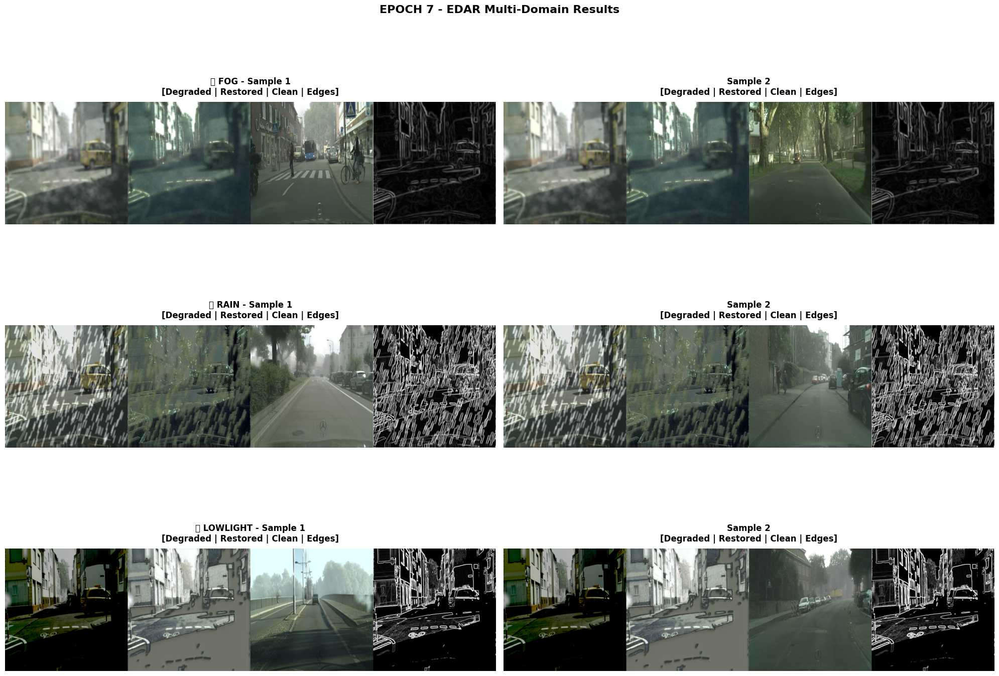

✅ Samples saved to: ./edar_multidomain_samples/[domain]/ep07_sampleX.png



Epoch 8/8: 100%|██████████| 750/750 [38:29<00:00,  3.08s/it, G=0.747, D=0.104, Edge=0.048, dom=lowlight]


Epoch 8/8 Summary:
  Overall Generator Loss: 0.9101
    ├─ Adversarial: 0.7546
    ├─ Perceptual:  0.0966
    ├─ Identity:    0.0087
    └─ Edge (NEW):  0.0503
  Discriminator Loss:     0.0824

  Per-Domain Generator Losses:
    🌫️  Fog:      0.8747
    🌧️  Rain:     1.0511
    🌙 Lowlight: 0.8045

Generating preview samples...



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


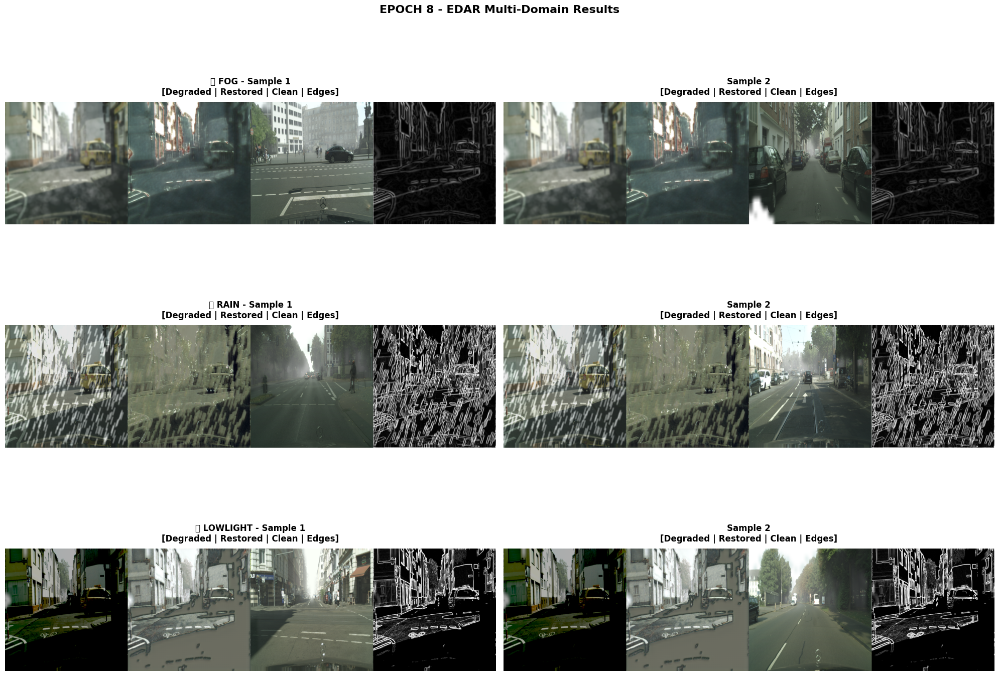

✅ Samples saved to: ./edar_multidomain_samples/[domain]/ep08_sampleX.png


✅ MULTI-DOMAIN TRAINING COMPLETE!

✅ MULTI-DOMAIN TRAINING COMPLETE!
Model can now handle fog, rain, AND lowlight with domain adaptation!


In [15]:
# ============================================================
# CELL 17: TRAIN MULTI-DOMAIN EDAR
# ============================================================

print("="*60)
print("🌐 TRAINING EDAR ACROSS ALL DOMAINS (FOG + RAIN + LOWLIGHT)")
print("="*60)

# Wrap model
if 'edar_model' not in locals():
    edar_model = EDARWrapper(model, n_domains=3).to(device)

# Train on ALL domains
edar_multidomain = train_edar_multidomain_with_gan(
    edar_model=edar_model,
    discriminator=disc,
    vgg_model=vgg,
    train_loaders=train_loaders,  # Pass all 3 loaders!
    val_loaders=val_loaders,
    epochs=8,
    device=device,
    save_dir='./edar_multidomain_checkpoints'
)

print("\n✅ MULTI-DOMAIN TRAINING COMPLETE!")
print("Model can now handle fog, rain, AND lowlight with domain adaptation!")

In [16]:
# # ============================================================
# # CELL 15: EDAR TRAINING FUNCTION
# # ============================================================

# from tqdm import tqdm
# import os

# def train_edar_single_domain(
#     edar_model,
#     train_loader,
#     val_loader,
#     domain='fog',
#     epochs=3,
#     device='cuda',
#     save_dir='./edar_checkpoints'
# ):
#     """Train EDAR for single degradation domain"""
    
#     os.makedirs(save_dir, exist_ok=True)
#     os.makedirs(f'./edar_samples/{domain}', exist_ok=True)
    
#     # Freeze base Restormer, only train EDAR components + refinement
#     for param in edar_model.restormer.parameters():
#         param.requires_grad = False
    
#     # Unfreeze refinement + output
#     for param in edar_model.restormer.refinement.parameters():
#         param.requires_grad = True
#     for param in edar_model.restormer.output.parameters():
#         param.requires_grad = True
    
#     # EDAR components are already trainable
    
#     # Optimizers
#     edar_params = (
#         list(edar_model.edge_extractor.parameters()) +
#         list(edar_model.domain_encoder.parameters()) +
#         list(edar_model.edge_refine.parameters()) +
#         list(edar_model.domain_mod.parameters())
#     )
#     refinement_params = (
#         list(edar_model.restormer.refinement.parameters()) +
#         list(edar_model.restormer.output.parameters())
#     )
    
#     opt_edar = torch.optim.Adam(edar_params, lr=1e-4, betas=(0.9, 0.999))
#     opt_refine = torch.optim.Adam(refinement_params, lr=5e-6, betas=(0.9, 0.999))
    
#     # Loss
#     l1_loss = nn.L1Loss()
    
#     # Mixed precision
#     scaler = torch.cuda.amp.GradScaler(enabled=(device=="cuda"))
    
#     # Training loop
#     best_loss = float('inf')
    
#     for epoch in range(1, epochs+1):
#         edar_model.train()
#         epoch_losses = {'l1': [], 'edge': [], 'total': []}
        
#         pbar = tqdm(train_loader, desc=f'[{domain.upper()}] Epoch {epoch}/{epochs}')
        
#         for degraded, clean, _ in pbar:
#             degraded, clean = degraded.to(device), clean.to(device)
            
#             opt_edar.zero_grad(set_to_none=True)
#             opt_refine.zero_grad(set_to_none=True)
            
#             with torch.cuda.amp.autocast(enabled=(device=="cuda")):
#                 # Forward
#                 restored, edges_pred = edar_model(degraded, domain=domain)
#                 edges_target = edar_model.edge_extractor(clean)
                
#                 # Losses
#                 loss_recon = l1_loss(restored, clean)
#                 loss_edge = l1_loss(edges_pred, edges_target) * 0.1
#                 total_loss = loss_recon + loss_edge
            
#             # Backward
#             scaler.scale(total_loss).backward()
#             scaler.step(opt_edar)
#             scaler.step(opt_refine)
#             scaler.update()
            
#             # Track
#             epoch_losses['l1'].append(loss_recon.item())
#             epoch_losses['edge'].append(loss_edge.item())
#             epoch_losses['total'].append(total_loss.item())
            
#             pbar.set_postfix({
#                 'L1': f'{loss_recon.item():.4f}',
#                 'Edge': f'{loss_edge.item():.4f}'
#             })
        
#         # Epoch summary
#         avg_loss = np.mean(epoch_losses['total'])
#         print(f"\nEpoch {epoch} - Avg Loss: {avg_loss:.4f}")
        
#         # Save checkpoint
#         ckpt_path = f'{save_dir}/edar_{domain}_ep{epoch:02d}.pth'
#         torch.save(edar_model.state_dict(), ckpt_path)
        
#         if avg_loss < best_loss:
#             best_loss = avg_loss
#             best_path = f'{save_dir}/edar_{domain}_best.pth'
#             torch.save(edar_model.state_dict(), best_path)
#             print(f"✅ Best model saved: {best_path}")
        
#         # Save sample outputs every 2 epochs
#         if epoch % 2 == 0:
#             save_epoch_samples(edar_model, val_loader, domain, epoch, device)
    
#     print(f"\n✅ Training complete for {domain}!")
#     print(f"   Best checkpoint: {best_path}")
#     return edar_model


# def save_epoch_samples(model, val_loader, domain, epoch, device):
#     """Save preview images"""
#     import torchvision.utils as vutils
    
#     model.eval()
#     with torch.no_grad():
#         for idx, (degraded, clean, name) in enumerate(val_loader):
#             if idx >= 3:  # Save 3 samples
#                 break
            
#             degraded = degraded.to(device)
#             restored, edges = model(degraded, domain=domain)
            
#             # Create grid: [degraded | restored | edges]
#             grid = torch.cat([
#                 degraded[0:1],
#                 restored[0:1],
#                 edges[0:1].repeat(1, 3, 1, 1)  # Edge map as RGB
#             ], dim=3)
            
#             save_path = f'./edar_samples/{domain}/ep{epoch:02d}_sample{idx}.png'
#             vutils.save_image(grid, save_path, normalize=False)
    
#     model.train()
#     print(f"   Samples saved to ./edar_samples/{domain}/")

# print("✅ Training function ready!")

In [17]:
# # ============================================================
# # CELL 16: TRAIN FOG DOMAIN
# # ============================================================

# print("="*60)
# print("🌫️  TRAINING EDAR FOR FOG DEGRADATION")
# print("="*60)

# # Train fog model
# edar_fog = train_edar_single_domain(
#     edar_model=edar_model,
#     train_loader=train_loaders['fog'],
#     val_loader=val_loaders['fog'],
#     domain='fog',
#     epochs=8,  # ~3-4 hours with your T4 GPU
#     device=device,
#     save_dir='./edar_checkpoints'
# )

# print("\n✅ FOG TRAINING COMPLETE!")
